In [ ]:
import torch
import matplotlib.pylab as plt
import numpy as np
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import os

import stylegan2

In [ ]:
input_path = 'checkpoint'
latents_path = os.path.join(input_path, 'latents.pth')
generator_path = os.path.join(input_path, 'Gs.pth')
device =  device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
batch_size = 4
seed = 0

In [ ]:
state = torch.load(latents_path, map_location=device)

qlatents_data = state['qlatents_data']
dlatents_data = state['dlatents_data']
labels_data = state['labels_data']
tags = state['tags']

G = stylegan2.models.load(generator_path)

In [ ]:
zipped = list(zip(dlatents_data, labels_data))

train_size = int(0.7 * len(zipped))
valid_size = int(len(zipped) * 0.2)
test_size = len(zipped) - train_size - valid_size

train_dataset, valid_dataset, test_dataset = torch.utils.data.random_split(zipped, [train_size, valid_size, test_size])

datasets = dict(
    train =  torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4),
    valid = torch.utils.data.DataLoader(valid_dataset, batch_size=batch_size, shuffle=True, num_workers=4),
    test = test_dataset,
)

In [ ]:
class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()
        # kernel
        self.main = nn.Sequential(
          nn.Linear(in_features=16*512, out_features=1),
          nn.LeakyReLU(0.2),
          nn.Sigmoid(),
        )

    def forward(self, x):
        return self.main(x)

In [ ]:
def train_coeff(tag, total=5):
    model = Net()
    # create your optimizer
    optimizer = optim.SGD(model.parameters(), lr=0.01)
    criterion = nn.BCELoss()
    [tag_index], = np.where(tags == tag)
    
    epoch = 0
    while True:
        epoch += 1
        training_loss, valid_loss = 0.0, 0.0
        for phase in ['train', 'valid']:
            dataset = datasets[phase]
            if phase == 'train':
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0

            for (dlatents, labels) in dataset:
                # in your training loop:
                optimizer.zero_grad()   # zero the gradient buffers
                with torch.set_grad_enabled(phase == 'train'):
                    inputs = dlatents.reshape(-1, 16*512)
                    output = model(inputs)
                    targets = torch.Tensor(0, 1)
                    for label in labels:
                        value = label[tag_index]
                        #value = 1.0 if value > 0.5 else 0.0
                        new_label = torch.Tensor([[value]])
                        targets = torch.cat((targets, new_label))

                    loss = criterion(output, targets)

                    if phase == 'train':
                        loss.backward()
                        optimizer.step()    # Does the update
                # statistics
                running_loss += loss.item() * inputs.size(0)

            epoch_loss = running_loss / (len(dataset) * batch_size)
            print(f'Epoch:{epoch}/{total}, {phase} Loss: {epoch_loss:.4f}')
            
        if epoch == total:
            break
        
    weight = model.state_dict()['main.0.weight']
    return torch.Tensor(weight).reshape(16, 512)

In [ ]:
result = {}
result['black_hair'] = train_coeff('black_hair', 3)

In [ ]:
def generate_image(dlatents, pixel_min=-1, pixel_max=1):
    generated = G(dlatents=dlatents)
    if pixel_min != 0 or pixel_max != 1:
        generated = (generated - pixel_min) / (pixel_max - pixel_min)
    generated.clamp_(min=0, max=1)
    return generated.detach().reshape(3, 512, 512).permute(1, 2, 0)

In [119]:
def move_and_show(latent_vector, direction, coeffs):
    fig,ax = plt.subplots(1, len(coeffs), figsize=(25, 25), dpi=80)
    for i, coeff in enumerate(coeffs):
        new_latent_vector = latent_vector.clone()
        new_latent_vector[:8] = (latent_vector + coeff*direction)[:8]
        ax[i].imshow(generate_image(new_latent_vector))
        ax[i].set_title('Coeff: %0.1f' % coeff)
    [x.axis('off') for x in ax]
    plt.show()

In [133]:
def move_and_show_samples(direction, sample=3, coeffs=[-5, -1.5, 0, 1.5, 5]):
    for (latents, labels) in list(datasets['test'])[:sample]:
        inputs = latents.clone().reshape(1, 16, 512)
        move_and_show(inputs, direction, coeffs)

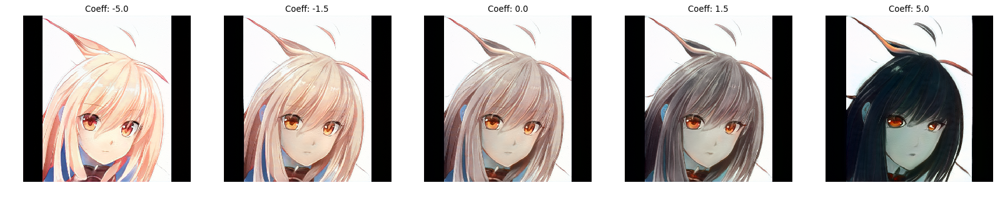

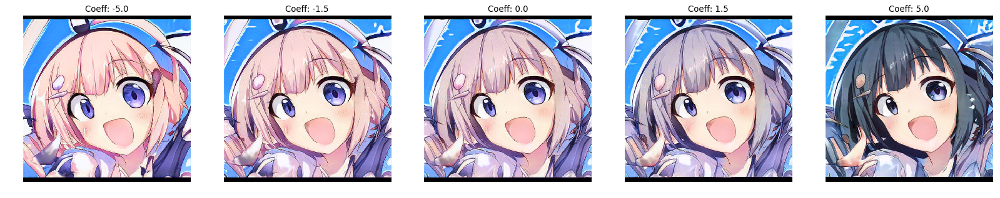

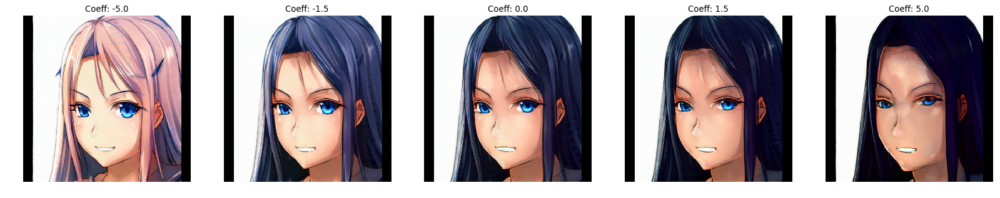

In [126]:
## Let's show some sample of the result
move_and_show_samples(result['black_hair'])

In [ ]:
## Let's pick some tags and train it!

colors = ['aqua', 'black', 'blue', 'brown',  'green', 'grey', 'lavender', 'light_brown', 'multicolored', 'orange', 'pink', 'purple', 'red', 'silver', 'white', 'yellow']
switches = ['open', 'closed', 'covered']

# generate composition of elements
components = ['eyes', 'hair', 'mouth']

picked_tags = []
for component in components:
    picked_tags = picked_tags + [f'{color}_{component}' for color in colors]
    picked_tags = picked_tags + [f'{switch}_{component}' for switch in switches]
    
# filter out the real tags
picked_tags = [tag for tag in picked_tags if tag in tags]
print(picked_tags)

In [ ]:
## Train all these tags!
for tag in picked_tags:
    print(f'training {tag}')
    result[tag] = train_coeff(tag, 3)

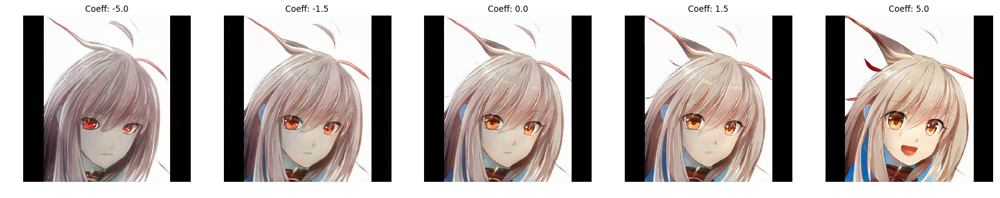

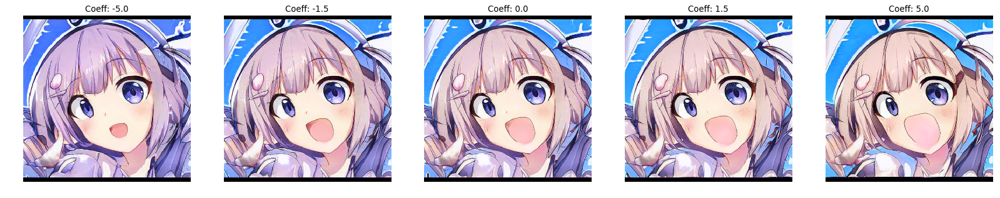

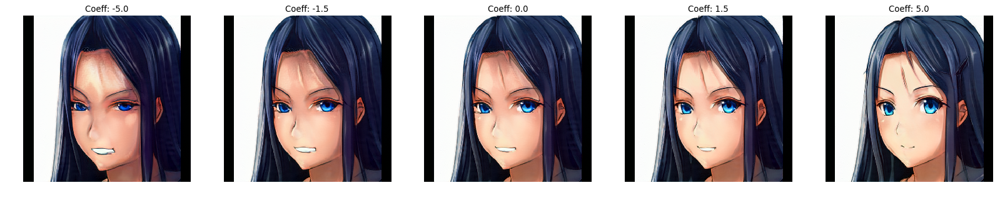

In [123]:
# try some of them
move_and_show_samples(result['open_mouth'])

In [127]:
# play a bit more, training charater specify encoder?

charas = ['hakurei_reimu', 'kirisame_marisa']

In [128]:
# Let's check out how many samples we got
for chara in charas:
    [chara_index], = np.where(tags == chara)
    count = [x[chara_index] for x in labels_data if x[chara_index] > 0.5]
    print(f'{chara}: {len(count)}, {(len(count) / len(labels_data)) *100}%')
    result[chara] = train_coeff(chara, 3)

hakurei_reimu: 63, 0.315%
Epoch:1/3, train Loss: 0.0413
Epoch:1/3, valid Loss: 0.0421
Epoch:2/3, train Loss: 0.0384
Epoch:2/3, valid Loss: 0.0417
Epoch:3/3, train Loss: 0.0374
Epoch:3/3, valid Loss: 0.0412
kirisame_marisa: 194, 0.97%
Epoch:1/3, train Loss: 0.0640
Epoch:1/3, valid Loss: 0.0668
Epoch:2/3, train Loss: 0.0580
Epoch:2/3, valid Loss: 0.0651
Epoch:3/3, train Loss: 0.0556
Epoch:3/3, valid Loss: 0.0666


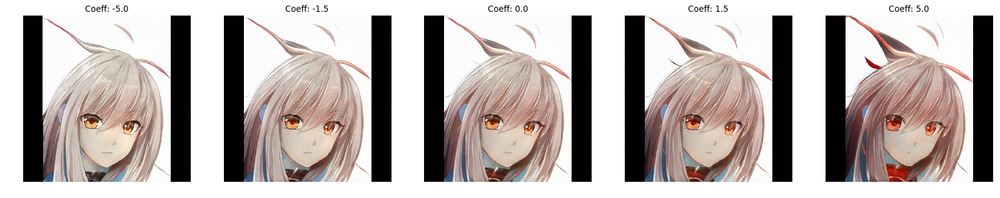

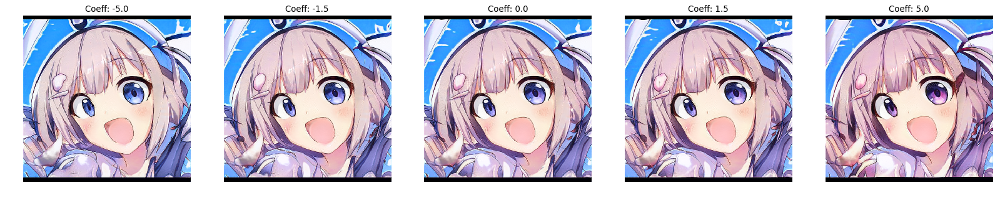

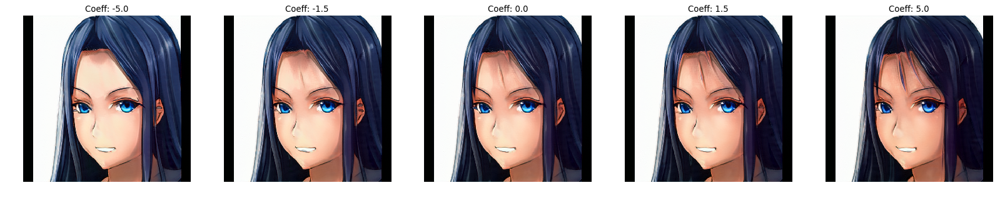

In [136]:
# too rare, properly don't work
move_and_show_samples(result['hakurei_reimu'])

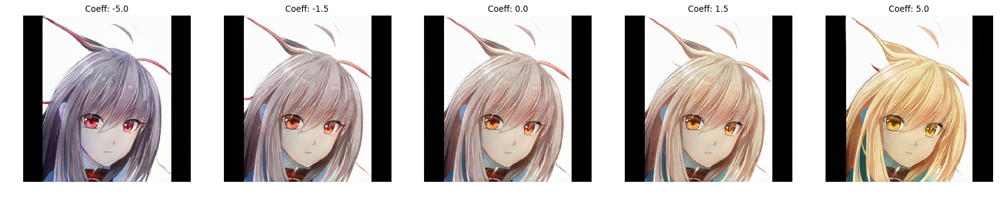

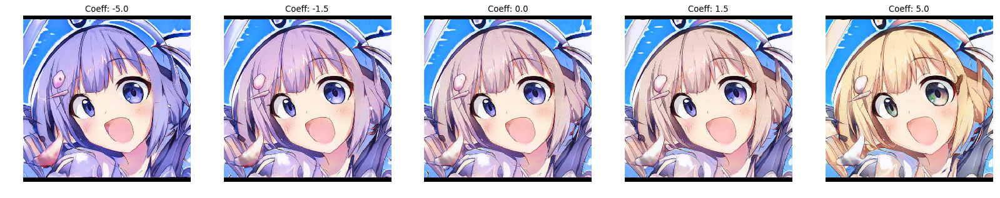

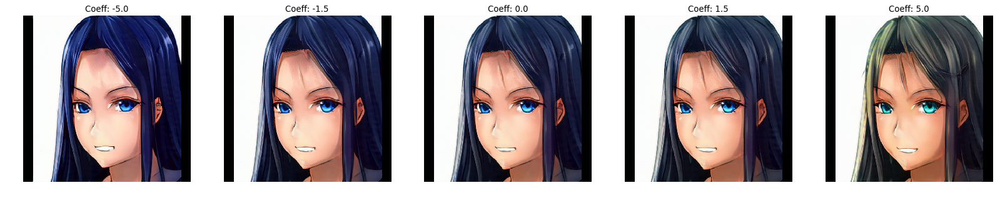

In [137]:
move_and_show_samples(result['kirisame_marisa'])

In [121]:
# store the result
torch.save(result, 'checkpoint/directions.pth')